In [2]:
import pypsa
import openpyxl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.patches as mpatches

In [3]:
tech_colors= {
    'onwind': "#235ebc",
    'onshore wind': "#235ebc",
    'offwind': "#6895dd",
    'offshore wind': "#6895dd",
    'offwind-ac': "#6895dd",
    'offshore wind (AC)': "#6895dd",
    'offwind-dc': "#74c6f2",
    'offshore wind (DC)': "#74c6f2",
    'hydro': '#298c81',
    'hydro reservoir': '#298c81',
    'ror': '#3dbfb0',
    'run of river': '#3dbfb0',
    'hydroelectricity': '#298c81',
    'PHS': '#51dbcc',
    'wave': '#a7d4cf',
    'solar': "#f9d002",
    'solar utility': "#f9d002",
    'solar PV': "#f9d002",
    'solar thermal': '#ffbf2b',
    'solar rooftop': 'orange',
        'solar distributed': 'orange',
    'OCGT': '#e0986c',
    'gas': '#e05b09',
    'fossil gas': '#e05b09',
    'natural gas': '#e05b09',
    'CCGT': '#a85522',
    'Nuclear': '#ff8c00',
    'Nuclear marginal': '#ff8c00',
    'nuclear': 'brown',
    'uranium': '#ff8c00',
    'battery discharger': '#ace37f',
    'utility battery charger': '#ace37f',
    'battery charger': '#ace37f',
    'utility battery discharger': '#ace37f',
    'home battery charger': '#80c944',
    'home battery discharger': '#80c944',
    'distributed battery charger': '#80c944',
    'distributed battery discharger': '#80c944',
    'hydrogen': '#bf13a0',
    'SMR': '#870c71',
    'SMR CC': '#4f1745',
    'H2 Fuel Cell': '#c251ae',
    'H2 Electrolysis': '#ff29d9',
    'electricity distribution grid': 'grey',
    'electricity': 'black',
    'hydrogen': 'red',
    'methane' : '#870c71',
     'oil' : '#a7d4cf',
    'p_nom_opt' : '#870c71',
     'p_nom_max' : '#a7d4cf',
    'transmission' : 'darkgrey',
    'other high voltage' :'grey',

    
}

In [4]:
def get_energy_production (n, s, e , energy_type ,exclude_list, country) :
     gen_list=['onwind', 'offwind','solar','solar rooftop', 'ror']
     link_list=['home battery discharger','battery discharger','H2 Fuel Cell','nuclear','CCGT','OCGT']
     storage_list=['PHS','hydro']
     if energy_type is not 'all':
        if energy_type is 'distributed':
            exclude_list.extend(['solar', 'onwind', 'offwind', 'ror','nuclear','battery discharger','H2 Fuel Cell',
                                 'PHS', 'hydro','CCGT','OCGT'])
        if energy_type is 'utility':
            exclude_list.extend(['solar rooftop', 'home battery discharger'])    
     temp={}
     for k in gen_list:
        if k is 'offwind' : 
          elec = n.generators[n.generators.carrier.isin(['offwind-ac','offwind-dc'])].index 
        else :
          elec = n.generators[n.generators.carrier.isin([k])].index
        temp[k]=2*(n.generators_t.p[elec][s:e].filter(like=country).sum(axis=1)/1e3)   #GWh
     for k in link_list:
          elec = n.links[n.links.carrier.isin([k])].index
          temp[k]=2*((-1)*n.links_t.p1[elec][s:e].filter(like=country).sum(axis=1)/1e3)   #GWh
     for k in storage_list:
          elec = n.storage_units[n.storage_units.carrier.isin([k])].index
          temp[k]=2*(n.storage_units_t.p[elec][s:e].filter(like=country).sum(axis=1)/1e3)  #GWh
          temp[k] = temp[k].clip(lower=0)    #only PHS discharging
            
     #temp['PHS discharge'] = temp.pop('PHS')  
     temp['run of river'] = temp.pop('ror')              
     temp['utility battery discharger'] = temp.pop('battery discharger')              
     temp['home battery discharger'] = temp.pop('home battery discharger')              
     temp['solar utility'] = temp.pop('solar')  
     temp['solar distributed'] = temp.pop('solar rooftop')  

    
     colors=[]
     for key in temp.keys() : 
        colors.append(tech_colors[key])
     return temp, colors

<>:5: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:6: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:9: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:13: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:5: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:6: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:9: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:13: SyntaxWarning: "is" with a literal. Did you mean "=="?
/tmp/ipykernel_11822/4083431915.py:5: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if energy_type is not 'all':
/tmp/ipykernel_11822/4083431915.py:6: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if energy_type is 'distributed':
/tmp/ipykernel_11822/4083431915.py:9: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if energy_type is 'utility':
/tmp/ipykernel_11822/4083431915.py:13: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if k is 'offwind' :


In [5]:
def get_energy_usage (n, s, e , energy_type ,exclude_list, country) :
     link_list=('home battery charger','battery charger','H2 Electrolysis')
     storage_list=['PHS']
     if energy_type is not 'all':
        if energy_type is 'distributed':
            exclude_list.extend(['solar', 'onwind', 'offwind', 'ror','nuclear','battery charger','H2 Electrolysis',
                                 'PHS', 'hydro','CCGT','OCGT'])
        if energy_type is 'utility':
            exclude_list.extend(['solar rooftop', 'home battery charger'])    
     temp={}
     
     for k in link_list:
        if k not in exclude_list:  
          elec = n.links[n.links.carrier.isin([k])].index
          temp[k]=2*((-1)*n.links_t.p0[elec][s:e].filter(like=country).sum(axis=1)/1e3)   #GWh
            
     for k in storage_list:
          elec = n.storage_units[n.storage_units.carrier.isin([k])].index
          temp[k]=(-2)*(n.storage_units_t.p[elec][s:e].filter(like=country).sum(axis=1)/1e3)  #GWh
          temp[k] = temp[k].clip(lower=0)    #for PHS charging
          temp[k] = (-1)*temp[k]
        
     temp['utility battery charger'] = temp.pop('battery charger')              
     temp['home battery charger'] = temp.pop('home battery charger')              

     colors=[]
     for key in temp.keys() : 
        colors.append(tech_colors[key])
        
   
     return temp, colors

<>:4: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:5: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:8: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:4: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:5: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:8: SyntaxWarning: "is" with a literal. Did you mean "=="?
/tmp/ipykernel_11822/2311001093.py:4: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if energy_type is not 'all':
/tmp/ipykernel_11822/2311001093.py:5: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if energy_type is 'distributed':
/tmp/ipykernel_11822/2311001093.py:8: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if energy_type is 'utility':


INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


Text(0, 0.5, 'Energy transmitted \n in distribution network [GWh]')

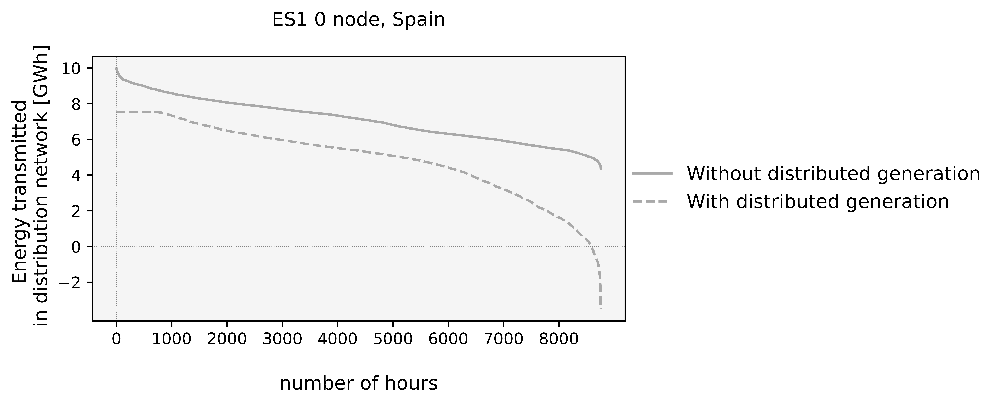

In [4]:
# Figure 6
#High-V to Low-V duration curves and change
import matplotlib.ticker as mticker
from matplotlib.lines import Line2D

fig, axs = plt.subplots(figsize=(6,3),sharex=True, sharey=False)  #5, 1, 
plt.rcParams['figure.dpi'] = 1000

networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':'Without distributed generation',
         'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'With distributed generation',}
countries=['ES1 0'] # , 'IT1 0', 'DE1 0', 'ES', ' ']
#      index=np.arange(len(results.columns))
style=['-','--']
for i,network in enumerate(networks):
   n=pypsa.Network(network) 
   for j,country in enumerate(countries): 
     df = 2*(n.links_t.p0.filter(like='distribution grid').filter(like=country)/1e3)  #GWh
     df = df.stack()
     to_plot = df.sort_values(ascending=False).reset_index(drop=True)
     to_plot.index = [k / len(df) * 8760 for k in to_plot.index]
     axs.plot(to_plot,color='darkgrey',linestyle=style[i])
     axs.set_title('ES1 0 node, Spain\n', fontsize=12)
     axs.set_facecolor("whitesmoke")
     axs.axvline(0, linewidth=0.5, linestyle=":", color="grey")
     axs.axvline(8760, linewidth=0.5, linestyle=":", color="grey")
     axs.axhline(0, linewidth=0.5, linestyle=":", color="grey")
   
legend_manual=[]
labels=['Without distributed generation','With distributed generation']

custom_lines = [Line2D([0], [0], color='darkgrey', linestyle=style[0]),
                Line2D([0], [0], color='darkgrey',linestyle=style[1])]

plt.legend(custom_lines, labels,loc='center right', bbox_to_anchor=(1.7, 0.5),ncol=1,
           fontsize=12, frameon=False) 
axs.set_yticks(np.arange(-2, 10.1, 2),fontsize=24)
axs.set_xticks(np.arange(0, 8001, 1000),fontsize=24)

#axs.xaxis.set_major_locator(1000)
axs.set_xlabel(xlabel='\nnumber of hours', fontsize=12)  
axs.set_ylabel(ylabel="Energy transmitted \n in distribution network [GWh]", fontsize=12)  


#axs.yaxis.set_minor_locator(mticker.FixedLocator((5, -1)))
#axs.yaxis.set_minor_formatter(mticker.FixedFormatter(("High-V to Low-V \nTransmission", "Low-V to High-V \nTransmission")))
#plt.setp(axs.yaxis.get_minorticklabels(), rotation=90, size=15, va="center")
#axs.tick_params("y",which="minor",pad=25, left=False)

#for ax in axs.flat:
#   ax.set(xlabel='number of days', ylabel="Energy transmission \n through distribution link [GWh]", fontsize=12)  


In [33]:
# Figure S20
#High-V to Low-V duration curves and change
import matplotlib.ticker as mticker
from matplotlib.lines import Line2D

fig, axs = plt.subplots(3,1, figsize=(10,12),sharex=True, sharey=False)  #5, 1, 
plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')

#fig.subplots_adjust(wspace=0.1)
#fig.subplots_adjust(wspace=0.1)

networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':'Without distributed generation',
         'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'With distributed generation',}
colors=['darkred','navy']
countries=[' ','DE','ES'] # , 'IT1 0', 'DE1 0', 'ES', ' ']
#      index=np.arange(len(results.columns))
country_nams={' ':'Europe','DE':'Germany','ES':'Spain'}


for i,network in enumerate(networks):
   n=pypsa.Network(network) 
   for j,country in enumerate(countries): 
     df = 2*(n.links_t.p0.filter(like='distribution grid').filter(like=country)/1e3)  #GWh
     df = df.stack()
     to_plot = df.sort_values(ascending=False).reset_index(drop=True)
     to_plot.index = [k / len(df) * 8760 for k in to_plot.index]
     axs[j].plot(to_plot,color=colors[i])
     axs[j].set_title(country_nams[country], fontsize=18)
     axs[j].set_facecolor("whitesmoke")
     axs[j].axvline(0, linewidth=0.5, linestyle=":", color="grey")
     axs[j].axvline(8760, linewidth=0.5, linestyle=":", color="grey")
     axs[j].axhline(0, linewidth=0.5, linestyle=":", color="grey")
     axs[j].set_ylabel(ylabel="Energy transmission \n through distribution \n link [GWh]\n", fontsize=20)
     axs[j].tick_params(axis='x', labelsize=18 )
     axs[j].tick_params(axis='y', labelsize=18 )
    
axs[j].set_xlabel(xlabel='\nnumber of days', fontsize=18)  

legend_manual=[]
labels=['Without distributed generation','With distributed generation']

custom_lines = [Line2D([0], [0], color=colors[0]),
                Line2D([0], [0], color=colors[1])]

plt.legend(custom_lines, labels,loc='center right', bbox_to_anchor=(1.6, 3),ncol=1,
           fontsize=18, frameon=False) 
#axs.set_yticks(np.arange(-2, 10.1, 2),fontsize=24)
#axs.set_xticks(np.arange(0, 8001, 1000),fontsize=24)

#axs.xaxis.set_major_locator(1000)


#axs.yaxis.set_minor_locator(mticker.FixedLocator((5, -1)))
#axs.yaxis.set_minor_formatter(mticker.FixedFormatter(("High-V to Low-V \nTransmission", "Low-V to High-V \nTransmission")))
#plt.setp(axs.yaxis.get_minorticklabels(), rotation=90, size=15, va="center")
#axs.tick_params("y",which="minor",pad=25, left=False)

#for ax in axs.flat:
#   ax.set(xlabel='number of days', ylabel="Energy transmission \n through distribution link [GWh]", fontsize=12)  


INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


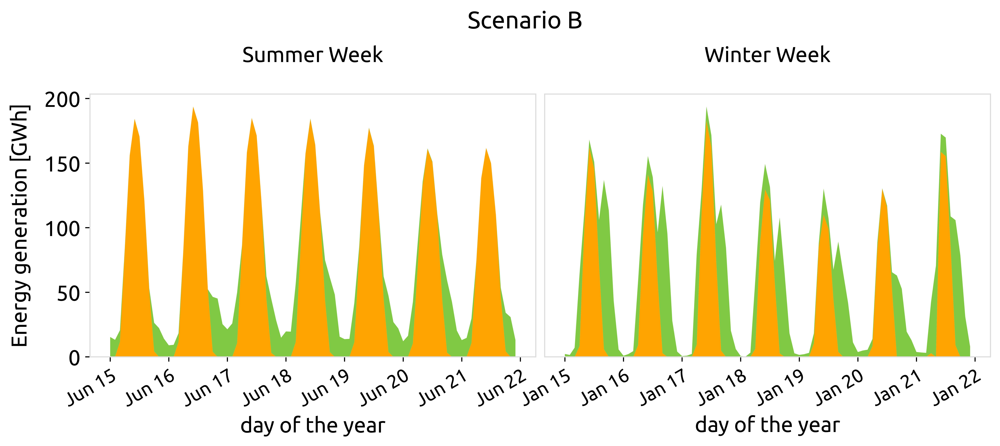

In [53]:
# Figure 8.a
from datetime import datetime
plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')

Dist_factor=[2]
transmission_expansion=[1.0]
fig, axs = plt.subplots(1, 2, figsize=(12,4),sharey=False) 
s=[datetime(2013,6,14).timetuple().tm_yday*12, datetime(2013,1,14).timetuple().tm_yday *12 ]  #(194 , 14)* 12
e=[datetime(2013,6,21).timetuple().tm_yday*12, datetime(2013,1,21).timetuple().tm_yday*12]    #(201, 21) *12
fig.subplots_adjust(wspace=0.02)
fig.subplots_adjust(hspace=0.01)
tr_ex=1.1   #1.0
dist_f=2
year=2030
#country='ES1 0'
date_form = DateFormatter("%b %-d")

for i,season in enumerate(['Summer', 'Winter']):
     n=pypsa.Network('postnetworks/elec_s_181_lv{}__Co2L0p05-2H-solar+p3-dist{}_{}.nc'.format
                     (tr_ex,dist_f,year))   
     energy_production, colors=get_energy_production(n, s[i], e[i], 'distributed', [])  
     axs[i].set_prop_cycle(color=colors)
     axs[i].stackplot(n.snapshots[s[i]:e[i]],energy_production.values())
     #axs[i, j].plot(n.loads_t.p.sum(axis=1)[s:e],color='black')
     axs[i].set_title('{} Week\n'.format(season),fontsize=16)   
     axs[i].set_xlabel('day of the year', fontsize=16)
     axs[i].tick_params(axis='y', labelsize=16)
     axs[i].xaxis.set_major_formatter(date_form)
     for label in axs[i].get_xticklabels(which='major'):
            label.set(rotation=45, fontsize= 14, rotation_mode='anchor',ha='right')

axs[0].set_yticks(np.arange(0, 201, 50),fontsize=20)
axs[1].set_yticks([], [])   
#for ax in axs.flat:
axs[0].set_ylabel('Energy generation [GWh]',size=16,labelpad=10)
#axs.set_xticks([], [])

# Hide x labels and tick labels for top plots and y ticks for right plots.
#for ax in axs.flat:
#    ax.label_outer()
#labels1=['load'] 

labels1=[] 
for key in energy_production.keys() : 
        labels1.append(key)

#plt.legend(labels1, loc='center right', bbox_to_anchor=(2.2, 0.5),ncol=1,
 #          fontsize=14, frameon=False) 
fig.text(0.45, 1.05, "Scenario B", 
         fontsize=18)
fig.autofmt_xdate()


In [1]:
import matplotlib.ticker as ticker
from mpl_toolkits.axes_grid1 import make_axes_locatable

def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw={}, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if not ax:
        ax = plt.gca()

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    divider = make_axes_locatable(ax)   ##
    cax = divider.append_axes("right", size="5%", pad=0.05)   ##
    cbar = ax.figure.colorbar(im, cax=cax, **cbar_kw)        ##ax=ax
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels) #([1, 1.5, 2, 'opt'])  #(col_labels)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels) #([0, 1, 5, 10]) #(row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    #ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=("black", "white"),
                     threshold=None, **textkw):
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A pair of colors.  The first is used for values below a threshold,
        the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.5__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.5__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lvopt__Co2L0p05-2H-solar+p3-

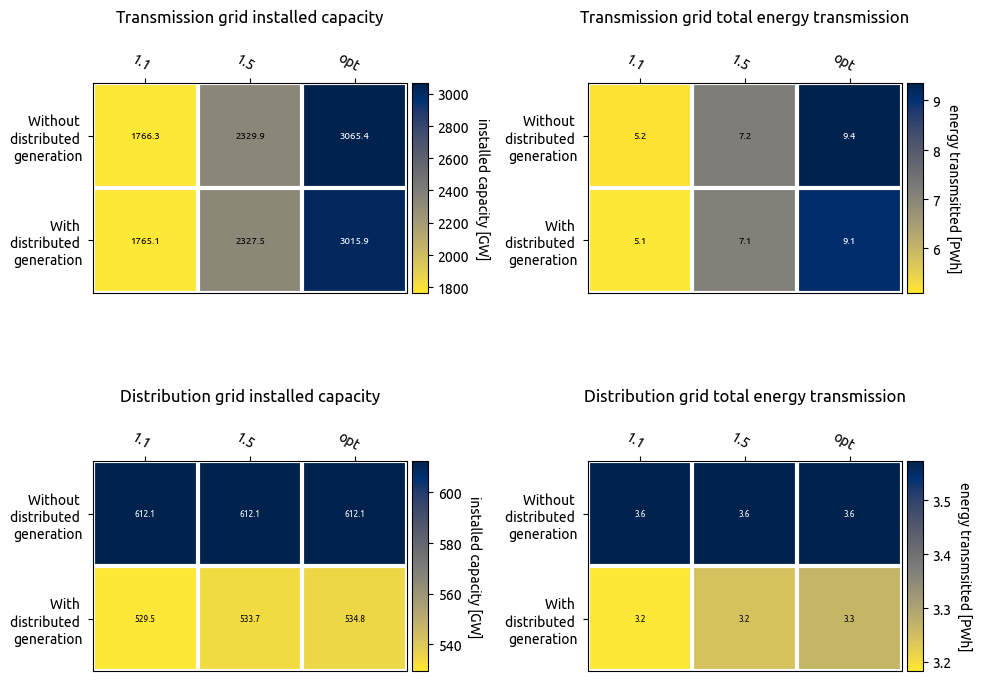

In [4]:
# Figure S18
from matplotlib.patches import FancyArrowPatch
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')

fig, axs = plt.subplots(2,2, figsize=(10,8))
plt.rcParams['figure.dpi'] = 1000
fig.subplots_adjust(wspace=0.1)
fig.subplots_adjust(hspace=0.1)

networks=['postnetworks/elec_s_181_lv{}__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc',  #noH2network in whole directory
          'postnetworks/elec_s_181_lv{}__Co2L0p05-2H-solar+p3-dist2_2030.nc']
#colors=['darkred','navy']
#countries=['ES1 0' , 'IT1 0', 'DE1 0', 'ES', ' ']


Dist_factor=[1, 2]
transmission_expansion=[1.1, 1.5, 'opt']
var1=np.zeros([len(networks), len(transmission_expansion)])
var2=np.zeros([len(networks), len(transmission_expansion)])
var3=np.zeros([len(networks), len(transmission_expansion)])
var4=np.zeros([len(networks), len(transmission_expansion)])

for i,network in enumerate(networks):
    for k, tr_ex in enumerate(transmission_expansion):
        n=pypsa.Network(network.format(tr_ex))
        var1[i,k] = (n.lines.s_nom_opt.sum()+
                    n.links.p_nom_opt[[i for i in n.links.index if 'DC' in n.links.carrier[i]]].sum())/1e3 #GW
        var2[i,k] = 2*(n.lines_t.p1.abs().sum().sum()+
                             n.links_t.p1[[t for t in n.links.index if 'DC' in n.links.carrier[t]]].abs().sum().sum())/1e9 #PW
        var3[i,k] = n.links.p_nom_opt.filter(like='distribution grid').sum()/1e3 #GW
        var4[i,k] = 2*n.links_t.p0.filter(like='distribution grid').abs().sum().sum()/1e9 #PWh
        #print(tr_ex, (n.lines.s_nom_opt - n.lines.s_nom).sum())

im1, _ = heatmap(var1, ['Without \ndistributed \ngeneration', 'With \ndistributed \ngeneration'], transmission_expansion, ax=axs[0,0],
                cmap="cividis_r", cbarlabel="installed capacity [GW]")
annotate_heatmap(im1, valfmt="{x:.1f}", size=7)
im2, _ = heatmap(var2, ['Without \ndistributed \ngeneration', 'With \ndistributed \ngeneration'], transmission_expansion, ax=axs[0,1],
                cmap="cividis_r", cbarlabel="energy transmsitted [PWh]")
annotate_heatmap(im2, valfmt="{x:.1f}", size=7)
im3, _ = heatmap(var3, ['Without \ndistributed \ngeneration', 'With \ndistributed \ngeneration'], transmission_expansion, ax=axs[1,0],
                cmap="cividis_r", cbarlabel="installed capacity [GW]") 
annotate_heatmap(im3, valfmt="{x:.1f}", size=6)
im4, _ = heatmap(var4, ['Without \ndistributed \ngeneration', 'With \ndistributed \ngeneration'], transmission_expansion, ax=axs[1,1],
                cmap="cividis_r", cbarlabel="energy transmsitted [PWh]")
annotate_heatmap(im4, valfmt="{x:.1f}", size=6)



axs[0,0].set_title("Transmission grid installed capacity\n")
axs[0,1].set_title("Transmission grid total energy transmission\n")
axs[1,0].set_title("Distribution grid installed capacity\n")
axs[1,1].set_title("Distribution grid total energy transmission\n")

fig.tight_layout()
plt.show()

In [119]:
# Figure S19
from matplotlib.patches import FancyArrowPatch
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')


fig, axs = plt.subplots(2,2, figsize=(10,10))
plt.rcParams['figure.dpi'] = 1000
path=[('','',''),('../Sensitivity-runs/','-noH2network','1'), ('../Sensitivity-runs/','-noH2network','1')]  #1st directory has noh2network, but not in the names
                                                                                                                       #loss cost
networks=['../Sensitivity-runs/postnetworks/elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist1-noH2network_2030.nc',          # 10% 1  
          'postnetworks/elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist2_2030.nc',                                          # 10%  2
          '../Sensitivity-runs/postnetworks/elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist1-noH2network-higheff1_2030.nc',                      # 0   1
          '../Sensitivity-runs/postnetworks/elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist2-noH2network-higheff1_2030.nc',] # 0   2

#colors=['darkred','navy']
#countries=['ES1 0' , 'IT1 0', 'DE1 0', 'ES', ' ']


Dist_factor=[1, 2]
transmission_expansion=[1.1, 1.5, 'opt']
var1=np.zeros([2,2])
var2=np.zeros([2,2])
var3=np.zeros([2,2])
var4=np.zeros([2,2])

j=0

for i in range(2):
  for k in range(2):  
        n=pypsa.Network(networks[j])
        var1[i,k] = (n.lines.s_nom_opt.sum()+
                    n.links.p_nom_opt[[i for i in n.links.index if 'DC' in n.links.carrier[i]]].sum())/1e3 #GW
        var2[i,k] = 2*(n.lines_t.p1.abs().sum().sum()+
                             n.links_t.p1[[t for t in n.links.index if 'DC' in n.links.carrier[t]]].abs().sum().sum())/1e6 #PW
        var3[i,k] = n.links.p_nom_opt.filter(like='distribution grid').sum()/1e3 #GW
        var4[i,k] = 2*n.links_t.p0.filter(like='distribution grid').abs().sum().sum()/1e6 #TWh
        j+=1
        
im1, _ = heatmap(var1, ['10% loss', 'no loss'],['500 €/kW' , '1000 €/kW'], ax=axs[0,0],
                cmap="viridis_r", cbarlabel="installed capacity [GW]")
annotate_heatmap(im1, valfmt="{x:.1f}", size=7)
im2, _ = heatmap(var2, ['10% loss', 'no loss'],['500 €/kW' , '1000 €/kW'], ax=axs[0,1],
                cmap="viridis_r", cbarlabel="energy transmission [TWh]")
annotate_heatmap(im2, valfmt="{x:.1f}", size=7)
im3, _ = heatmap(var3, ['10% loss', 'no loss'],['500 €/kW' , '1000 €/kW'], ax=axs[1,0],
                cmap="viridis_r", cbarlabel="installed capacity [GW]")
annotate_heatmap(im3, valfmt="{x:.1f}", size=7)
im4, _ = heatmap(var4, ['10% loss', 'no loss'],['500 €/kW' , '1000 €/kW'], ax=axs[1,1],
                cmap="viridis_r", cbarlabel="energy transmission [TWh]")
annotate_heatmap(im4, valfmt="{x:.1f}", size=7)



axs[0,0].set_title("Transmission grid installed capacity")
axs[0,1].set_title("Transmission grid total energy transmission")
axs[1,0].set_title("Distribution grid installed capacity")
axs[1,1].set_title("Distribution grid total energy transmission")


fig.tight_layout()
plt.show()

INFO:pypsa.io:Imported network elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist1-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist1-noH2network-higheff1_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lvopt__Co2L0p05-2H-solar+p3-dist2-noH2network-higheff1_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


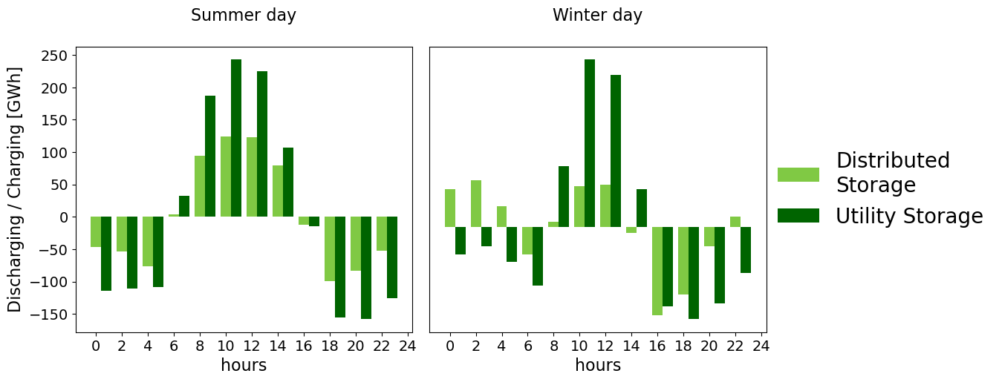

In [11]:
# Figure 8.b
import matplotlib.ticker as ticker

fig, axs = plt.subplots(1, 2, figsize=(12,5))  
fig.subplots_adjust(wspace=0.05)
year=2030
bar_width = 0.8
k=0
dist_f=2 #constant dist facotr
start=[194*12, 14*12]
end=[201*12, 21*12]
colors=[tech_colors['home battery charger'], 'darkgreen'] #tech_colors['battery discharger']

for tr_ex in [1.1]:
  n=pypsa.Network('postnetworks/elec_s_181_lv{}__Co2L0p05-2H-solar+p3-dist{}_{}.nc'.format
                     (tr_ex,dist_f,year))  
  s=start[0]
  e=end[0]
  df=pd.DataFrame((-2)*(n.stores_t.p.filter(like='home battery')[s:e].sum(axis=1))/1e3)
                    
  df['hour']=df.index.hour
  axs[0].bar(df['hour'][0:12],df.groupby(['hour']).mean().squeeze()
       ,bar_width ,label="distributed", color=colors[0])
  df=pd.DataFrame((-2)*(n.stores_t.p[n.stores[n.stores.carrier.isin(['battery'])].index][s:e].sum(axis=1)/1e3)
                           )
  df['hour']=df.index.hour  
  axs[0].bar(df['hour'][0:12]+bar_width,df.groupby(['hour']).mean().squeeze()
       ,bar_width ,label="distributed", color=colors[1])
  axs[0].set_title('Summer day\n',fontsize=16)  
    
  s=start[1]
  e=end[1]
  df=pd.DataFrame((-2)*(n.stores_t.p.filter(like='home battery')[s:e].sum(axis=1))/1e3)

  df['hour']=df.index.hour
  axs[1].bar(df['hour'][0:12],df.groupby(['hour']).mean().squeeze()
       ,bar_width ,label="distributed", color=colors[0])
  df=pd.DataFrame((-2)*(n.stores_t.p[n.stores[n.stores.carrier.isin(['battery'])].index][s:e].sum(axis=1))/1e3
                           )
  df['hour']=df.index.hour  
  axs[1].bar(df['hour'][0:12]+bar_width,df.groupby(['hour']).mean().squeeze()
       ,bar_width ,label="distributed", color=colors[1])  
  axs[1].set_title('Winter day\n',fontsize=16)  
  k+=1

#axs[0].set_yticks(np.arange(-100, 101, 25))
axs[0].tick_params(axis='y', labelsize=14)    
axs[1].set_yticks([],[])

axs[0].set_xticks(np.arange(0, 25, 2),fontsize=32)
axs[0].tick_params(axis='x', labelsize=14)    
axs[1].set_xticks(np.arange(0, 25, 2),fontsize=32)
axs[1].tick_params(axis='x', labelsize=14)    

axs[0].set_ylabel( ylabel='Discharging / Charging [GWh]', fontsize=16)    

  
plt.legend(['Distributed\nStorage','Utility Storage'],loc='center right', bbox_to_anchor=(1.7, 0.5), ncol=1,
           fontsize=20, frameon= False)

for ax in axs.flat:
    ax.set_xlabel(xlabel='hours', fontsize=16)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(2))

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


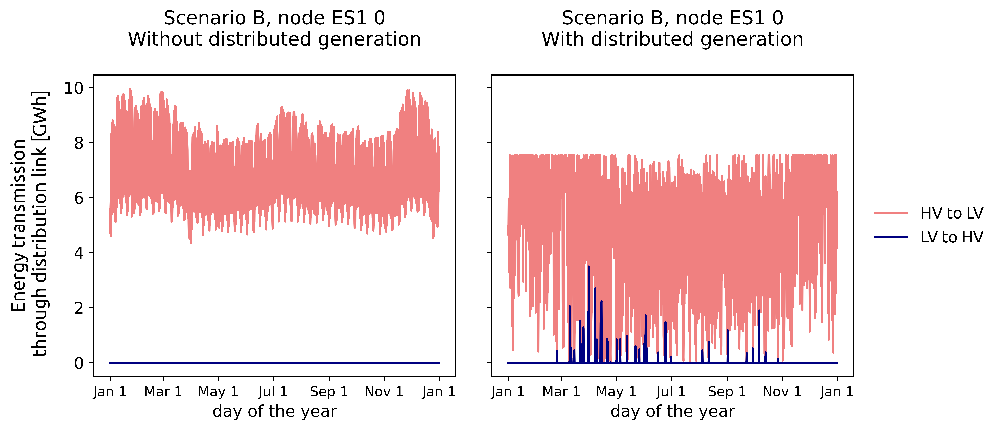

In [16]:
# Figure 6.a
import datetime
from matplotlib.dates import DateFormatter

fig, axs = plt.subplots(1, 2, figsize=(10,4),sharex=True, sharey=True) 
fig.subplots_adjust(wspace=0.1)

plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')

networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':'Without distributed generation',
         'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'With distributed generation',}
colors=['lightcoral','navy']
countries=['ES1 8' , 'IT1 0', 'DE1 0', 'ES', ' ']
country='ES1 0'

date_form = DateFormatter("%b %-d")

for i,network in enumerate(networks.keys()):
     n=pypsa.Network(network)
     axs[i].plot(2*n.links_t.p0.filter(like='distribution grid').filter(like=country)
              [n.links_t.p0.filter(like='distribution grid').filter(like=country)>0].sum(axis=1)/1e3, color='lightcoral',label='HV to LV')
     axs[i].plot((-2)*n.links_t.p0.filter(like='distribution grid').filter(like=country)
              [n.links_t.p0.filter(like='distribution grid').filter(like=country)<0].sum(axis=1)/1e3,color='navy',label='LV to HV')
     axs[i].set_title('Scenario B, node '+country+'\n' +networks[network]+'\n',fontsize=14)
     axs[i].set_xlabel("day of the year",fontsize=12)
     axs[i].tick_params(axis='y', labelsize=12)
     #axs[i].set_yticks(np.arange(0, 6.1, 2),fontsize=14)   
     axs[i].xaxis.set_major_formatter(date_form)
   
axs[0].set_ylabel('Energy transmission\n through distribution link [GWh]',fontsize=14, fontname = 'Ubuntu',labelpad=10)

#fig.autofmt_xdate()


plt.legend(loc='center right', bbox_to_anchor=(1.4, 0.5),ncol=1,
           fontsize=12, frameon=False) 


INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


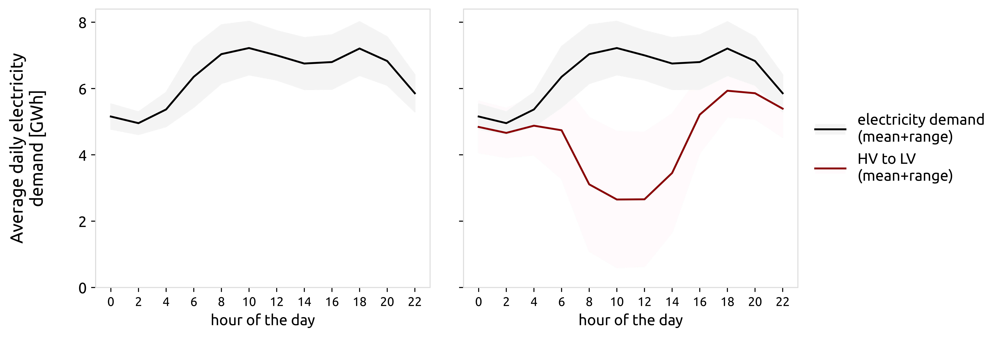

In [4]:
# Figure 6.b
import datetime
from matplotlib.dates import DateFormatter
fig, axs = plt.subplots(1, 2, figsize=(10,4),sharex=True, sharey=True) 
fig.subplots_adjust(wspace=0.1)

plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')

networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':'Without distributed generation',
         'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'With distributed generation',}

colors=['black','darkred']
countries=['ES1 8' , 'IT1 0', 'DE1 0', 'ES', ' ']
country='ES1 0'

date_form = DateFormatter("%b %-d")

for i,network in enumerate(networks.keys()):
    n=pypsa.Network(network)
    df_load=pd.DataFrame(2*n.loads_t.p.filter(like=country).sum(axis=1)/1e3)  #GWh 
    df_load['hour']=df_load.index.hour
    
    df_dist=pd.DataFrame((-2)*n.links_t.p1.filter(like='distribution grid') 
              [n.links_t.p1.filter(like='distribution grid')<0].filter(like=country).sum(axis=1)/1e3)  #P1 equals load, Po is higher due to 0.9 losses
    df_dist['hour']=df_dist.index.hour
    
    l_dist,= axs[i].plot(df_dist['hour'][0:12],df_dist.groupby(['hour']).mean(),color=colors[1],label='HV to LV')
    l_load,= axs[i].plot(df_load['hour'][0:12],df_load.groupby(['hour']).mean(),color=colors[0],label='load')
    
    axs[i].fill_between(df_dist['hour'][0:12],(df_dist.groupby(['hour']).mean()-df_dist.groupby(['hour']).std()).squeeze(),
                 (df_dist.groupby(['hour']).mean()+df_dist.groupby(['hour']).std()).squeeze(),color='snow')
    axs[i].fill_between(df_dist['hour'][0:12],(df_load.groupby(['hour']).mean()-df_load.groupby(['hour']).std()).squeeze(),
                 (df_load.groupby(['hour']).mean()+df_load.groupby(['hour']).std()).squeeze(),color='whitesmoke')
    r_dist = axs[i].fill(np.NaN, np.NaN, 'snow', alpha=1)
    r_load = axs[i].fill(np.NaN, np.NaN, 'whitesmoke', alpha=1)
    axs[i].set_xlabel("hour of the day",fontsize=12)
    axs[i].tick_params(axis='y', labelsize=12)
    axs[i].set_yticks(np.arange(0, 8.1, 2),fontsize=14)   
    axs[i].set_xticks(np.arange(0, 24, 2),fontsize=14)   
    #'if i==1 :  axs[i].legend([l_load, (l_dist, r_dist)], ["load (mean+range)", "HV to LV evergy\nflow (mean+range)"], loc=2)

axs[0].set_ylabel('Average daily electricity\ndemand [GWh]\n',fontsize=14,
                  fontname = 'Ubuntu',labelpad=10)

#fig.autofmt_xdate()

plt.legend([(r_load[0],l_load), (r_dist[0],l_dist)], ["electricity demand\n(mean+range)", "HV to LV\n(mean+range)"], 
           loc='center right', bbox_to_anchor=(1.6, 0.5),ncol=1,
          fontsize=12, frameon=False)
#plt.legend(loc='center right', bbox_to_anchor=(1.4, 0.5),ncol=1,
 #         fontsize=12, frameon=False) 

In [3]:
#figure S22
networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':'Without distributed generation',
         'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'With distributed generation',}
country='ES1 0'

low2high=pd.DataFrame({})
high2low=pd.DataFrame({})

for i,network in enumerate(networks.keys()):
     n=pypsa.Network(network)
     
     high2low[i]=(2*n.links_t.p0.filter(like='distribution grid').filter(like=country)
              [n.links_t.p0.filter(like='distribution grid').filter(like=country)>0].sum(axis=1))
        
     low2high[i]=((-2)*n.links_t.p0.filter(like='distribution grid').filter(like=country)
              [n.links_t.p0.filter(like='distribution grid').filter(like=country)<0].sum(axis=1))
    
    
low2high.to_csv('low2high.csv')
high2low.to_csv('high2low.csv')    

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [82]:
import datetime
from matplotlib.dates import DateFormatter

fig, axs = plt.subplots(2, 2, figsize=(12,6),sharex=True, ) 
fig.subplots_adjust(wspace=0.1)

def spectrum1(h, dt=1):
    nt = len(h)
    npositive = nt//2
    pslice = slice(1, npositive)
    freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice] 
    ft = np.fft.fft(h)[pslice]
    psraw = (np.abs(ft)/nt) ** 2

    # Convert PS to Power Spectral Density
    psdraw = psraw * dt * nt  # nt * dt is record length
    return freqs, psraw, psdraw


plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')

networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':'Without distributed generation',
         'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'With distributed generation',}
colors=['lightcoral','navy']
countries=['ES1 8' , 'IT1 0', 'DE1 0', 'ES', ' ']
country=' '

date_form = DateFormatter("%b %-d")

techs=['distribution grid HV to LV', 'distribution grid LV to HV']
network_type=networks.values()
data = pd.DataFrame(index=pd.MultiIndex.from_product([pd.Series(data=techs, name='tech',),
                                                       pd.Series(data=network_type, name='network_type',)]), 
                      columns=pd.Series(data=np.arange(0,4380), name='hour',))
idx = pd.IndexSlice

for i,network in enumerate(networks.keys()):
  n=pypsa.Network(network)
  network_type= networks[network] 
        
  data.loc[idx['distribution grid HV to LV', network_type,], :]=np.array(2*n.links_t.p0.filter(like='distribution grid').filter(like=country)
              [n.links_t.p0.filter(like='distribution grid').filter(like=country)>0].sum(axis=1))
  data.loc[idx['distribution grid LV to HV', network_type,], :]=np.array((-2)*n.links_t.p0.filter(like='distribution grid').filter(like=country)
              [n.links_t.p0.filter(like='distribution grid').filter(like=country)<0].sum(axis=1))
  

max=data.max(axis=1).max()
data = data/max  #normalize to show difference in data size 
     
for i,network_type in enumerate(networks.values()):
   for j,tech in enumerate(techs):
        
     data_= data.loc[idx[tech, network_type,], : ] 
     data_.reset_index(drop = True,inplace=True)
     dt=1
     freqs1, ps1, psd1 = spectrum1(data_, dt=dt)
     axs[i,j].semilogx(freqs1, ps1, colors[j], )   # ps1/ps1.max()
   axs[0,j].sharey(axs[1,j])


     #axs[i].set_yticks(np.arange(0, 6.1, 2),fontsize=14)   
  
   
axs[0,0].set_title('HV to LV',fontsize=14, fontname = 'Ubuntu')
axs[0,1].set_title('LV to LV',fontsize=14, fontname = 'Ubuntu')
axs[0,0].set_ylabel('Without distributed\n generation',fontsize=14, fontname = 'Ubuntu',labelpad=10)
axs[1,0].set_ylabel('With distributed\n generation',fontsize=14, fontname = 'Ubuntu',labelpad=10)

for ax in axs.flat:
    ax.set_xlabel('(hours)')
    
fig.text(0.5, 1 ,'Scenario B'
         ,fontsize=14, fontname = 'Ubuntu')

#fig.autofmt_xdate()



INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
/tmp/ipykernel_11813/1534291894.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice]
/tmp/ipykernel_11813/1534291894.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice]
/tmp/ipykernel_11813/1534291894.py:47: RuntimeWarning: invalid value encountered in divide
  axs[i,1].semilogx(freqs1, ps1/ps1.max(), colors[1], )
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
/tmp/ipykernel_11813/1534291894.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in np.arange(0,dt,1/(

Text(0.25, 1, '                   Scenario B')

In [94]:
#frequency for storage
import datetime
from matplotlib.dates import DateFormatter

fig, axs = plt.subplots(2, 3, figsize=(15,4),sharex=True, sharey=True) 
fig.subplots_adjust(wspace=0.2)

def spectrum1(h, dt=1):
    nt = len(h)
    npositive = nt//2
    pslice = slice(1, npositive)
    freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice] 
    ft = np.fft.fft(h)[pslice]
    psraw = (np.abs(ft)/nt) ** 2

    # Convert PS to Power Spectral Density
    psdraw = psraw * dt * nt  # nt * dt is record length
    return freqs, psraw, psdraw


plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')

colors=['lightcoral','navy','darkgreen']
countries=['ES1 8' , 'IT1 0', 'DE1 0', 'ES', ' ']
country=' '

date_form = DateFormatter("%b %-d")

for i,network in enumerate(networks.keys()):
     n=pypsa.Network(network)
     
     data=((2*n.links_t.p0.filter(like='H2 Electrolysis')
           .filter(like=country)>0).sum(axis=1))
     data.reset_index(drop = True,inplace=True)
     dt=1
     freqs1, ps1, psd1 = spectrum1(data, dt=dt)
     axs[i,0].semilogx(freqs1, ps1/ps1.max(), colors[0], )
    
     data=((2*n.links_t.p0.filter(like='Fuel Cell')
           .filter(like=country)>0).sum(axis=1))
     data.reset_index(drop = True,inplace=True)
     dt=1
     freqs1, ps1, psd1 = spectrum1(data, dt=dt)
     axs[i,1].semilogx(freqs1, ps1/ps1.max(), colors[1], )
        
        
     data=((n.stores_t.e[n.stores[n.stores.carrier.isin(['H2'])].index].filter(like=country).sum(axis=1)*100/
         n.stores.e_nom_opt[n.stores[n.stores.carrier.isin(['H2'])].index].filter(like=country).sum()).squeeze())
     data.reset_index(drop = True,inplace=True)
     dt=1
     freqs1, ps1, psd1 = spectrum1(data, dt=dt)
     axs[i,2].semilogx(freqs1, ps1/ps1.max(), colors[2], )   
        
        
     axs[i,0].tick_params(axis='y', labelsize=12)
     #axs[i].set_yticks(np.arange(0, 6.1, 2),fontsize=14)   
   
axs[0,0].set_title('Electrolysis',fontsize=14, fontname = 'Ubuntu')
axs[0,1].set_title('Fuel cell',fontsize=14, fontname = 'Ubuntu')
axs[0,2].set_title('H2 store fill level',fontsize=14, fontname = 'Ubuntu')

axs[0,0].set_ylabel('Without distributed\n generation',fontsize=14, fontname = 'Ubuntu',labelpad=10)
axs[1,0].set_ylabel('With distributed\n generation',fontsize=14, fontname = 'Ubuntu',labelpad=10)

for ax in axs.flat:
    ax.set_xlabel('(hours)')
    
fig.text(0.25, 1 ,'                   Scenario C'
         ,fontsize=14, fontname = 'Ubuntu')

#fig.autofmt_xdate()



INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
/tmp/ipykernel_21937/1051219243.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice]
/tmp/ipykernel_21937/1051219243.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice]
/tmp/ipykernel_21937/1051219243.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice]
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
/tmp/ipykernel_21937/1051219243.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in

Text(0.25, 1, '                   Scenario C')

In [95]:
#frequency for storage
import datetime
from matplotlib.dates import DateFormatter

fig, axs = plt.subplots(2, 3, figsize=(15,4),sharex=True,) 
fig.subplots_adjust(wspace=0.2)

def spectrum1(h, dt=1):
    nt = len(h)
    npositive = nt//2
    pslice = slice(1, npositive)
    freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice] 
    ft = np.fft.fft(h)[pslice]
    psraw = (np.abs(ft)/nt) ** 2

    # Convert PS to Power Spectral Density
    psdraw = psraw * dt * nt  # nt * dt is record length
    return freqs, psraw, psdraw



plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')

# scenario A:
#networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist1-nohomegen-higheff_2030.nc':'Without distributed generation',
 #        'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist1-higheff_2030.nc':'With distributed generation',}

networks={'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':'Without distributed generation',
         'postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'With distributed generation',}
colors=['darkred','navy','darkgreen',]
countries=['ES1 8' , 'IT1 0', 'DE1 0', 'ES', ' ']
country=' '

date_form = DateFormatter("%b %-d")


techs=['PHS charge','PHS discharge','PHS store']
network_type=networks.values()
data = pd.DataFrame(index=pd.MultiIndex.from_product([pd.Series(data=techs, name='tech',),
                                                       pd.Series(data=network_type, name='network_type',)]), 
                      columns=pd.Series(data=np.arange(0,4380), name='hour',))
idx = pd.IndexSlice

for i,network in enumerate(networks.keys()):
  n=pypsa.Network(network)
  network_type= networks[network] 
  data.loc[idx['PHS charge', network_type,], : ]=np.array(
  ((2*n.storage_units_t.p.filter(like='PHS').filter(like=country)
              [n.storage_units_t.p.filter(like='PHS').filter(like=country)>0].sum(axis=1))/
           n.storage_units.p_nom_opt.filter(like='PHS').filter(like=country).sum(axis=0)) )
  
  data.loc[idx['PHS discharge', network_type,], : ]=np.array(
  (((-2)*n.storage_units_t.p.filter(like='PHS').filter(like=country)
              [n.storage_units_t.p.filter(like='PHS').filter(like=country)<0].sum(axis=1))/
           n.storage_units.p_nom_opt.filter(like='PHS').filter(like=country).sum(axis=0)) )

  data.loc[idx['PHS store', network_type,], : ]=np.array(
    ((2)*n.storage_units_t.state_of_charge.filter(like='PHS').filter(like=country).sum(axis=1)/
                   6*n.storage_units.p_nom.filter(like='PHS').filter(like=country).sum()))
     
for i,network_type in enumerate(networks.values()):
   for j,tech in enumerate(techs):
     #print(tech)     
     data.loc[idx[tech, network_type,], : ]=(data.loc[idx[tech, network_type,], : ]/
         data.loc[tech].max().max())  #normalize with/without for same maximimum

     data_= data.loc[idx[tech, network_type,], : ] 
     data_.reset_index(drop = True,inplace=True)
     dt=1
     freqs1, ps1, psd1 = spectrum1(data_, dt=dt)
     axs[i,j].semilogx(freqs1, ps1, colors[j], )   # ps1/ps1.max()
     axs[0,j].sharey(axs[1,j])
     if i==0: axs[i,j].set_title(tech,fontsize=14, fontname = 'Ubuntu')
  


axs[0,0].set_ylabel('Without distributed\n generation',fontsize=14, fontname = 'Ubuntu',labelpad=10)
axs[1,0].set_ylabel('With distributed\n generation',fontsize=14, fontname = 'Ubuntu',labelpad=10)

for ax in axs.flat:
    ax.set_xlabel('(hours)')
    
fig.text(0.25, 1 ,'                   Scenario B'
         ,fontsize=14, fontname = 'Ubuntu')

#fig.autofmt_xdate()



INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
/tmp/ipykernel_21937/880799641.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  freqs = np.array([1/f for f in np.arange(0,dt,1/(nt))])[pslice]


Text(0.25, 1, '                   Scenario B')

In [1]:
# figure S21

def plot_price_duration_curve(n, carrier, bus, fn=None):
    df = n.buses_t.marginal_price.loc[:, n.buses.carrier == carrier]
    
    df= df.drop (labels=[i for i in df.columns if bus not in i], axis=1)   ##added

    df = df.stack()

    to_plot = df.sort_values(ascending=False).reset_index(drop=True)

    to_plot.index = [i / len(df) * 100 for i in to_plot.index]

    fig, ax = plt.subplots(figsize=(4, 2.5))
    to_plot.plot(
        ax=ax,
    )
    plt.xlabel("share of snapshots and nodes [%]")
    plt.ylabel("nodal price [EUR/MWh]")
    plt.axvline(0, linewidth=0.5, linestyle=":", color="grey")
    plt.axvline(100, linewidth=0.5, linestyle=":", color="grey")
    plt.axhline(0, linewidth=0.5, linestyle=":", color="grey")

    if carrier == "H2":
        title = "Hydrogen"
        plt.ylim([-20, 350])
    elif carrier == "AC":
        title = "Electricity"
        plt.ylim([-100, 1000])
    else:
        title = carrier

    plt.title(title, fontsize=12, color="#343434")

    #if fn is not None:
     #   plt.savefig(fn, bbox_inches="tight")
      #  plt.close()



In [26]:
n= pypsa.Network('postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc')

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [27]:
import datetime
from matplotlib.dates import DateFormatter
fig, axs = plt.subplots(1, 4, figsize=(16,4),sharex=True, sharey=True) 
fig.subplots_adjust(wspace=0.1)

plt.rcParams['figure.dpi'] = 1000

colors=['navy','darkred']
countries={'ES':'Spain','DE':'Germany','DK':'Denmark',' ':'Europe'}

date_form = DateFormatter("%b %-d")

for i, bus in enumerate(countries.keys()):
   #for j, carrier in enumerate(['AC','low voltage']):
    df_AC=pd.DataFrame(n.buses_t.marginal_price.loc[:, n.buses.carrier == 'AC'].filter(like=bus)
                       .mean(axis=1) )  ##added
    df_AC['hour']=df_AC.index.hour

    df_lowv=pd.DataFrame(n.buses_t.marginal_price.loc[:, n.buses.carrier == 'low voltage'].filter(like=bus)
                         .mean(axis=1) )   ##added
    df_lowv['hour']=df_lowv.index.hour
    
    l_lowv,= axs[i].plot(df_lowv['hour'][0:12],df_lowv.groupby(['hour']).mean(),color=colors[0],label='low voltage')
    l_AC,= axs[i].plot(df_AC['hour'][0:12],df_AC.groupby(['hour']).mean(),color=colors[1],label='AC')
    
    #axs[i].fill_between(df_lowv['hour'][0:12],(df_lowv.groupby(['hour']).mean()-df_lowv.groupby(['hour']).std()).squeeze(),
     #            (df_lowv.groupby(['hour']).mean()+df_lowv.groupby(['hour']).std()).squeeze(),color='whitesmoke')
    #axs[i].fill_between(df_AC['hour'][0:12],(df_AC.groupby(['hour']).mean()-df_AC.groupby(['hour']).std()).squeeze(),
    #             (df_AC.groupby(['hour']).mean()+df_AC.groupby(['hour']).std()).squeeze(),color='snow')
    r_lowv = axs[i].fill(np.NaN, np.NaN, 'whitesmoke', alpha=1)
    r_AC = axs[i].fill(np.NaN, np.NaN, 'snow', alpha=1)
    axs[i].set_facecolor('#FCFCFC') 
    #axs[i].set_xlabel("hour of the day",fontsize=12)
    axs[i].tick_params(axis='y', labelsize=16)
    axs[i].set_yticks(np.arange(0, 301, 100),fontsize=18)   
    axs[i].set_xticks(np.arange(0, 24, 4),fontsize=18)  
    axs[i].set_xticklabels([],fontsize=18)   
    axs[i].set_title(countries[bus],fontsize=18 )
    #'if i==1 :  axs[i].legend([l_load, (l_dist, r_dist)], ["load (mean+range)", "HV to LV evergy\nflow (mean+range)"], loc=2)

axs[0].set_ylabel('Scenario B\nWithout distributed techs\n\nAverage daily\nelectricity price [€/MWh]',fontsize=18,
                  fontname = 'Ubuntu',labelpad=10)
#fig.autofmt_xdate()

plt.legend([(r_lowv[0],l_lowv), (r_AC[0],l_AC)], ["LV price (mean)", "HV price (mean)"], 
           loc='center', bbox_to_anchor=(-0.5, 1.3),ncol=2,
          fontsize=12, frameon=False)
#plt.legend(loc='center right', bbox_to_anchor=(1.4, 0.5),ncol=1,
 #         fontsize=12, frameon=False) 

In [28]:
n= pypsa.Network('postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc')

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [29]:
import datetime
from matplotlib.dates import DateFormatter
fig, axs = plt.subplots(1, 4, figsize=(16,4),sharex=True, sharey=True) 
fig.subplots_adjust(wspace=0.1)

plt.rcParams['figure.dpi'] = 1000

colors=['navy','darkred']
countries={'ES':'Spain','DE':'Germany','DK':'Denmark',' ':'Europe'}

date_form = DateFormatter("%b %-d")

for i, bus in enumerate(countries.keys()):
   #for j, carrier in enumerate(['AC','low voltage']):
    df_AC=pd.DataFrame(n.buses_t.marginal_price.loc[:, n.buses.carrier == 'AC'].filter(like=bus)
                       .mean(axis=1) )  ##added
    df_AC['hour']=df_AC.index.hour

    df_lowv=pd.DataFrame(n.buses_t.marginal_price.loc[:, n.buses.carrier == 'low voltage'].filter(like=bus)
                         .mean(axis=1) )   ##added
    df_lowv['hour']=df_lowv.index.hour
    
    l_lowv,= axs[i].plot(df_lowv['hour'][0:12],df_lowv.groupby(['hour']).mean(),color=colors[0],label='low voltage')
    l_AC,= axs[i].plot(df_AC['hour'][0:12],df_AC.groupby(['hour']).mean(),color=colors[1],label='AC')
    
    #axs[i].fill_between(df_lowv['hour'][0:12],(df_lowv.groupby(['hour']).mean()-df_lowv.groupby(['hour']).std()).squeeze(),
     #            (df_lowv.groupby(['hour']).mean()+df_lowv.groupby(['hour']).std()).squeeze(),color='whitesmoke')
    #axs[i].fill_between(df_AC['hour'][0:12],(df_AC.groupby(['hour']).mean()-df_AC.groupby(['hour']).std()).squeeze(),
    #             (df_AC.groupby(['hour']).mean()+df_AC.groupby(['hour']).std()).squeeze(),color='snow')
    r_lowv = axs[i].fill(np.NaN, np.NaN, 'whitesmoke', alpha=1)
    r_AC = axs[i].fill(np.NaN, np.NaN, 'snow', alpha=1)
    axs[i].set_facecolor('#FCFCFC') 
    axs[i].set_xlabel("hour of the day",fontsize=16)
    axs[i].tick_params(axis='y', labelsize=16)
    axs[i].tick_params(axis='x', labelsize=16)

    axs[i].set_yticks(np.arange(0, 301, 100),fontsize=18)   
    axs[i].set_xticks(np.arange(0, 24, 4),fontsize=18)  
    #axs[i].set_title(countries[bus])
    #'if i==1 :  axs[i].legend([l_load, (l_dist, r_dist)], ["load (mean+range)", "HV to LV evergy\nflow (mean+range)"], loc=2)

axs[0].set_ylabel('Scenario B\nWith distributed techs\n\nAverage daily\nelectricity price [€/MWh]',fontsize=18,
                  fontname = 'Ubuntu',labelpad=10)
#fig.autofmt_xdate()

plt.legend([(r_lowv[0],l_lowv), (r_AC[0],l_AC)], ["LV price (mean)", "HV price (mean)"], 
           loc='center', bbox_to_anchor=(-0.5, 1.3),ncol=2,
          fontsize=12, frameon=False)
#plt.legend(loc='center right', bbox_to_anchor=(1.4, 0.5),ncol=1,
 #         fontsize=12, frameon=False) 